In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [2]:
# Pip install method (recommended)

!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 30.1/107.7 GB disk)


In [3]:
from ultralytics import YOLO
from IPython.display import display, Image

In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [5]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="KOWSf1xMKQu7fimiswHX")
project = rf.workspace("pfe-qmcoq").project("pfe-gzlge")
version = project.version(1)
dataset = version.download("yolov8")


/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PFE-1 in yolov8:: 100%|██████████| 4208/4208 [00:01<00:00, 2927.73it/s]


In [7]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8n.pt data='/content/drive/MyDrive/PFE/Detection/datasets/Dataset/data.yaml' epochs=200 imgsz=800 plots=True project='/content/drive/MyDrive/PFE/Detect/Training results' name='Detection'

/content
100% 6.23M/6.23M [00:00<00:00, 234MB/s]
New https://pypi.org/project/ultralytics/8.2.12 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/PFE/Detection/datasets/Dataset/data.yaml, epochs=200, patience=50, batch=16, imgsz=800, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/PFE/Detect/Training results, name=Detection, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, 

In [6]:
!ls '/content/drive/MyDrive/PFE/Detect/Training results/Detection'

args.yaml					    PR_curve.png      val_batch0_labels.jpg
confusion_matrix_normalized.png			    R_curve.png       val_batch0_pred.jpg
confusion_matrix.png				    results.csv       val_batch1_labels.jpg
events.out.tfevents.1715447845.4b4ee426e419.1737.0  results.png       val_batch1_pred.jpg
F1_curve.png					    test	      val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg  val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg  weights
P_curve.png					    train_batch2.jpg


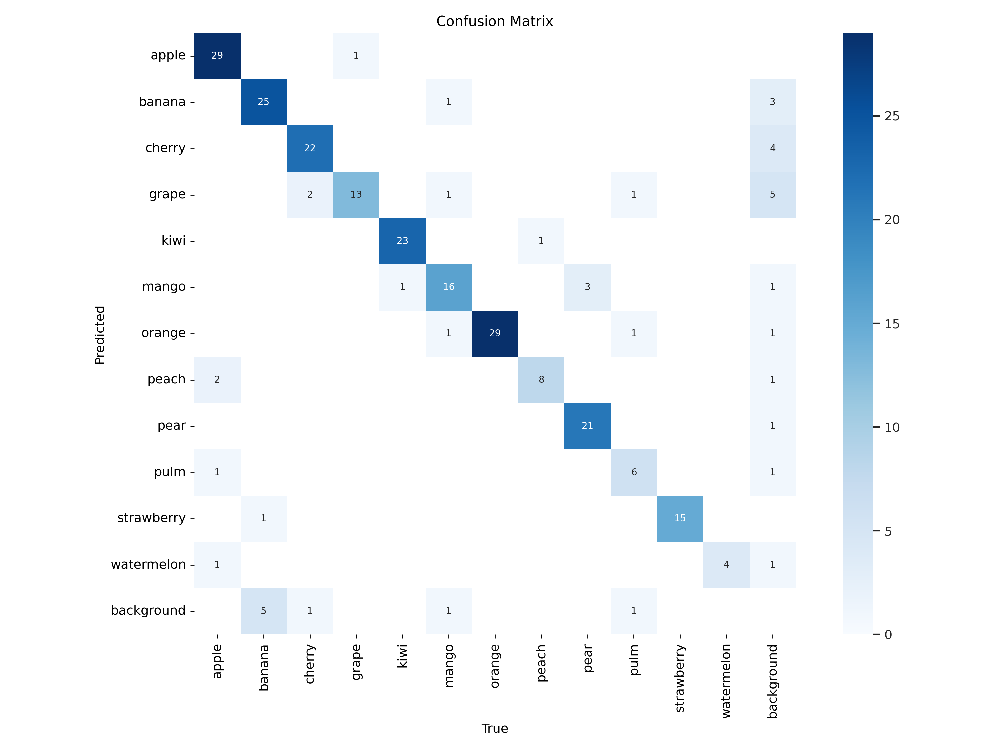

In [7]:

Image(filename=f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/confusion_matrix.png', width=800)

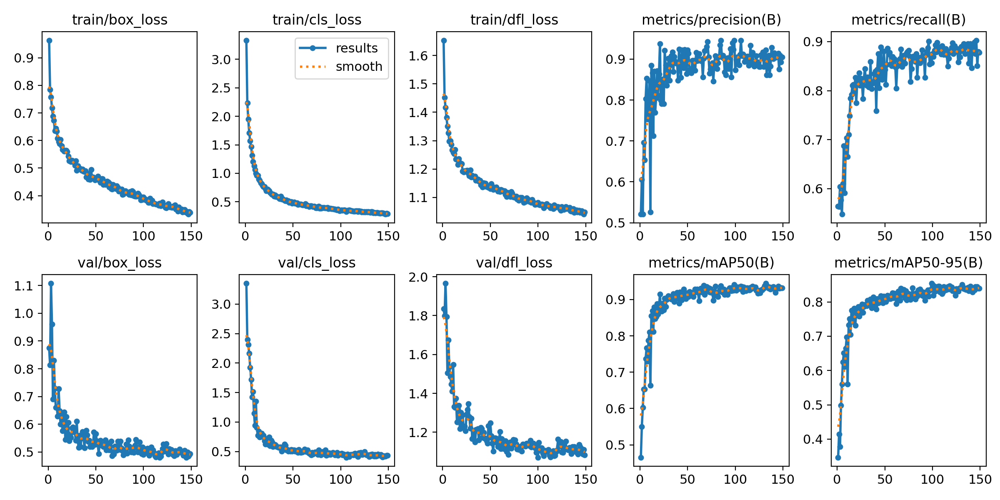

In [8]:

Image(filename=f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/results.png', width=600)

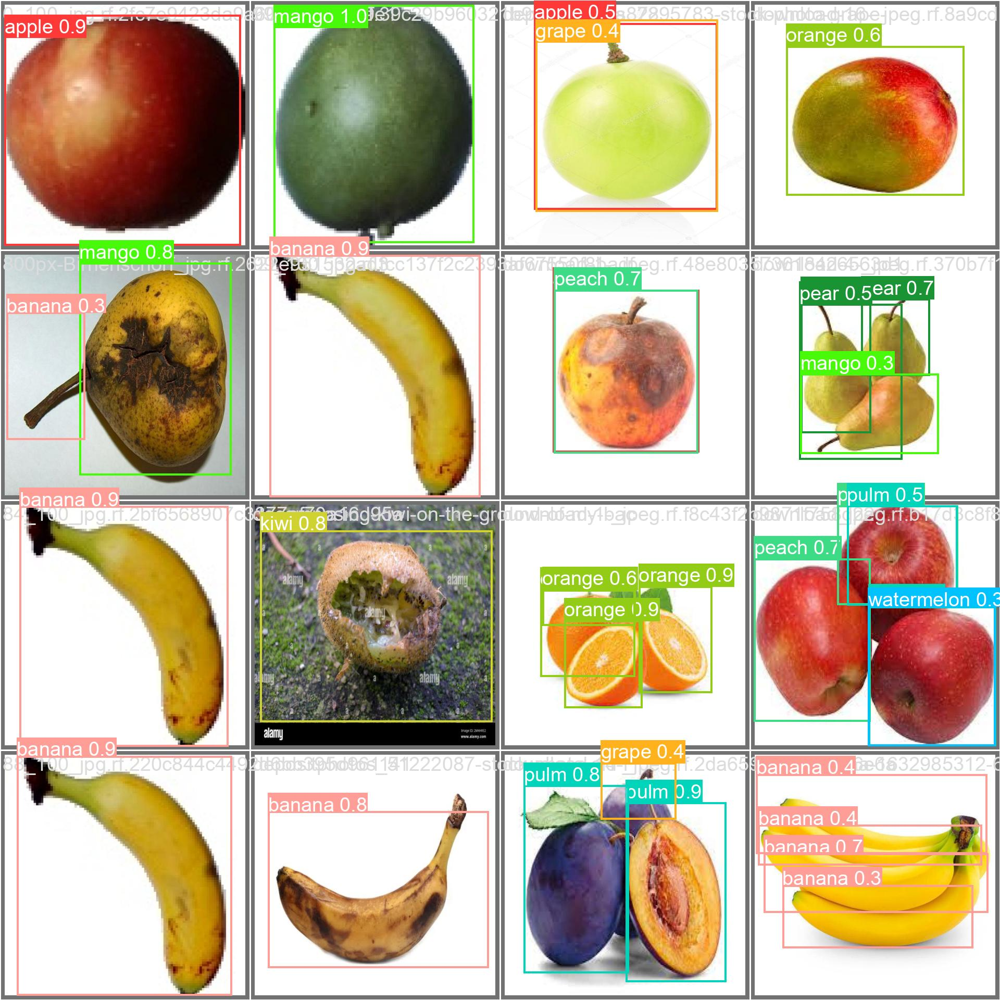

In [9]:

Image(filename=f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/val_batch0_pred.jpg', width=800)

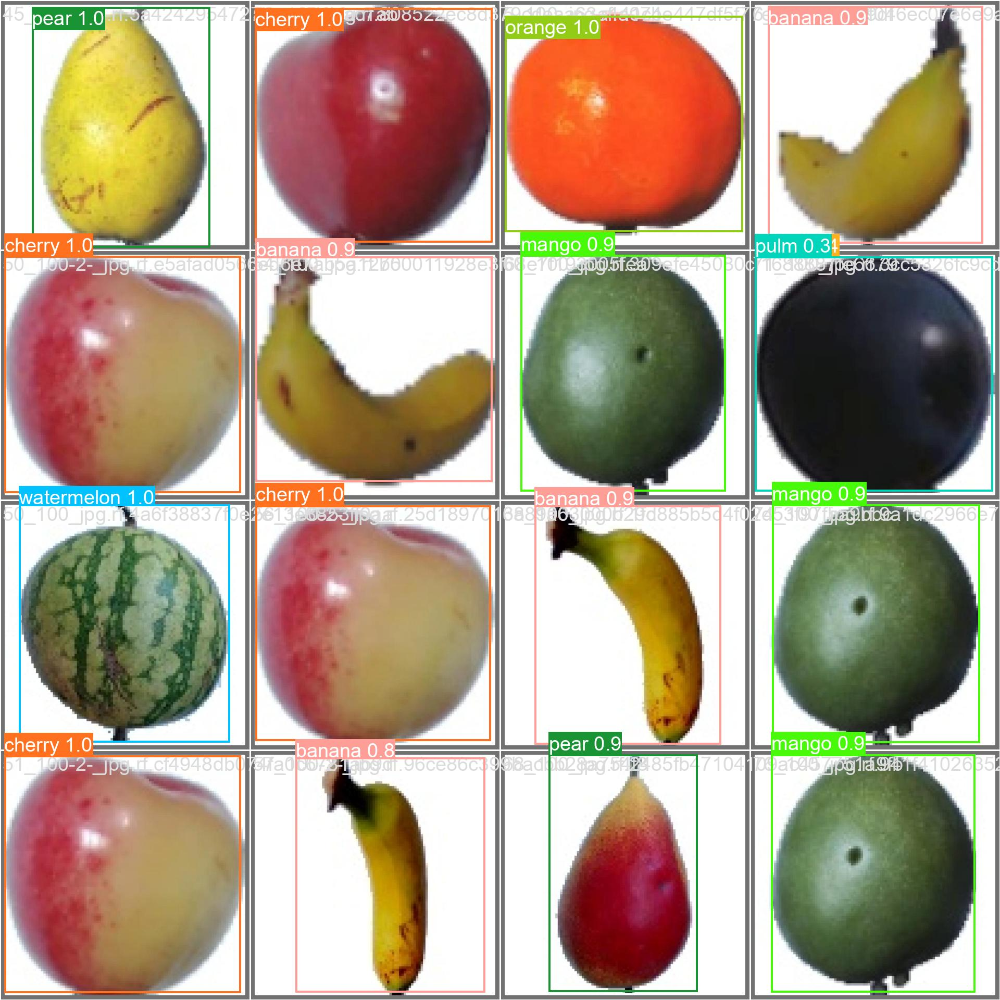

In [10]:
Image(filename=f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/val_batch1_pred.jpg', width=800)

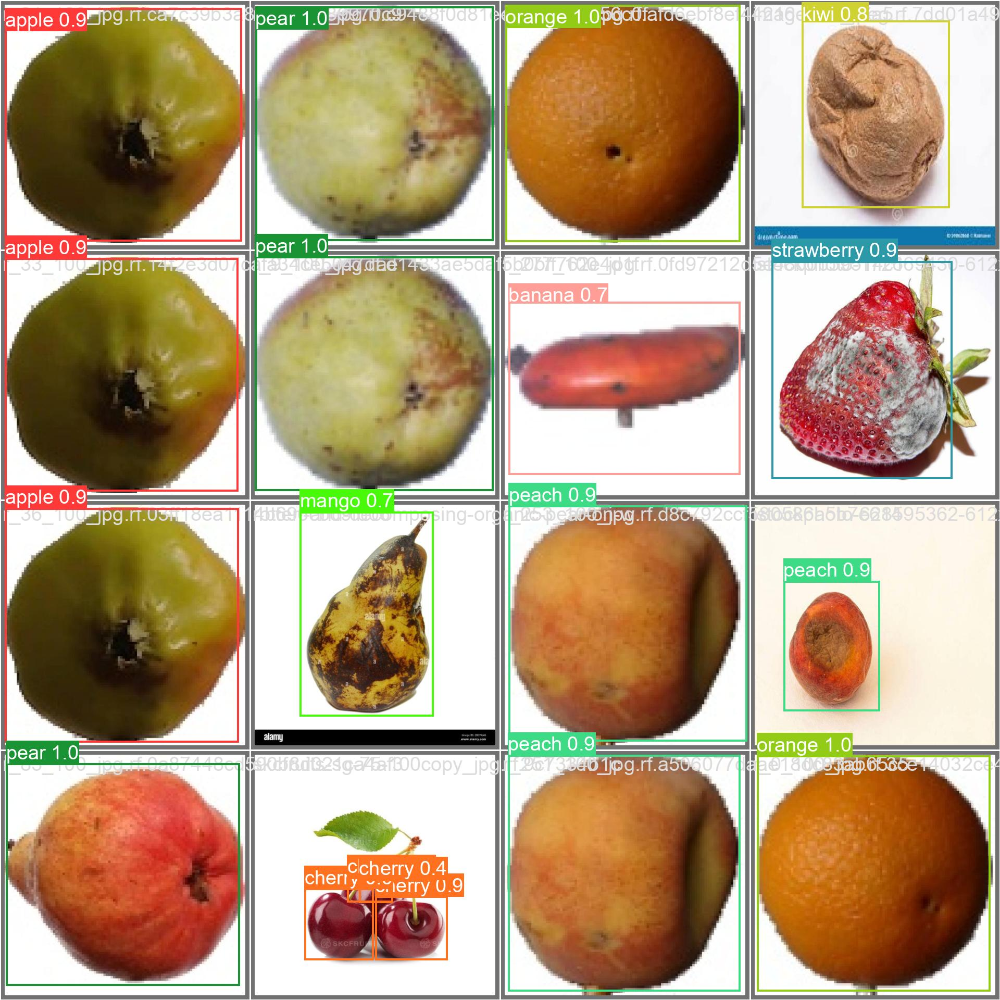

In [11]:
Image(filename=f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/val_batch2_pred.jpg', width=800)

In [12]:
!yolo task=detect mode=val model='/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt' data='/content/drive/MyDrive/PFE/Detection/datasets/Dataset/data.yaml' project='/content/drive/MyDrive/PFE/Detect/Training results' name='val'

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3007988 parameters, 0 gradients, 8.1 GFLOPs
100% 755k/755k [00:00<00:00, 17.3MB/s]
val: Scanning /content/drive/MyDrive/PFE/Detection/datasets/Dataset/valid/labels.cache... 202 images, 0 backgrounds, 0 corrupt: 100% 202/202 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 13/13 [02:03<00:00,  9.50s/it]
                   all        202        237      0.953      0.853      0.941      0.854
                 apple        202         33      0.994      0.818       0.96      0.872
                banana        202         31          1       0.63      0.807       0.65
                cherry        202         25          1      0.875      0.988      0.789
                 grape        202         14          1      0.922       0.99      0.946
                  kiwi        202         24      0.917      0.919  

In [13]:
%cd {HOME}
!yolo task=detect mode=predict model='/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt' conf=0.25 source='/content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images' save=True project='/content/drive/MyDrive/PFE/Detect/Training results/Detection' name='test'

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3007988 parameters, 0 gradients, 8.1 GFLOPs

image 1/134 /content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images/0_100-5-_jpg.rf.d7c77fe057b51bdd4913ab4a223efd38.jpg: 800x800 1 apple, 365.9ms
image 2/134 /content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images/101_100_jpg.rf.46cc06cf44d624bf716c62d24e093a65.jpg: 800x800 1 strawberry, 600.9ms
image 3/134 /content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images/101_100_jpg.rf.afba9228f8cfa8f3a0188978a4944a27.jpg: 800x800 1 watermelon, 333.3ms
image 4/134 /content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images/102_100_jpg.rf.03cce6585990ea509b12656fb80d6ff1.jpg: 800x800 1 strawberry, 338.8ms
image 5/134 /content/drive/MyDrive/PFE/Detection/datasets/Dataset/test/images/103_100_jpg.rf.6c3a363adb5be7df49fbbe8ac7079169.jpg: 800x800 1 kiwi, 317.7ms
image 6/134 /content/drive/MyDr

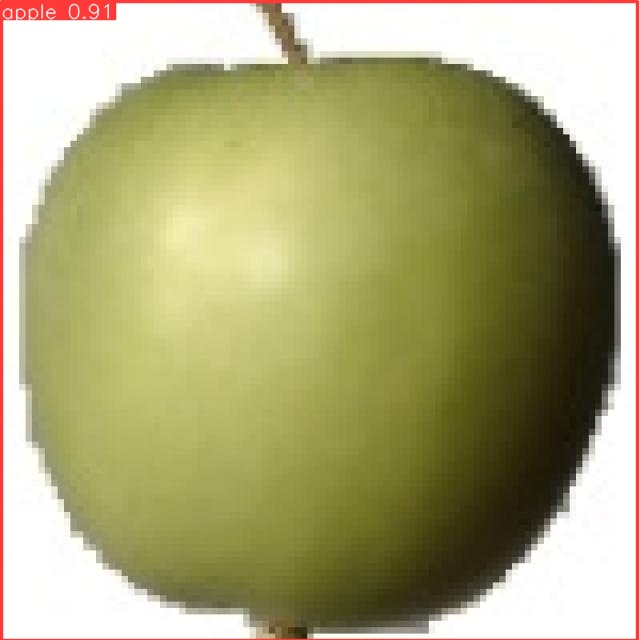

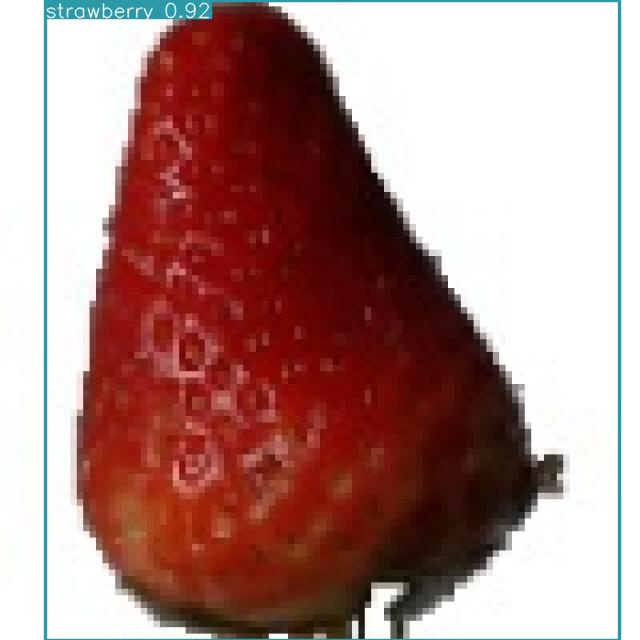

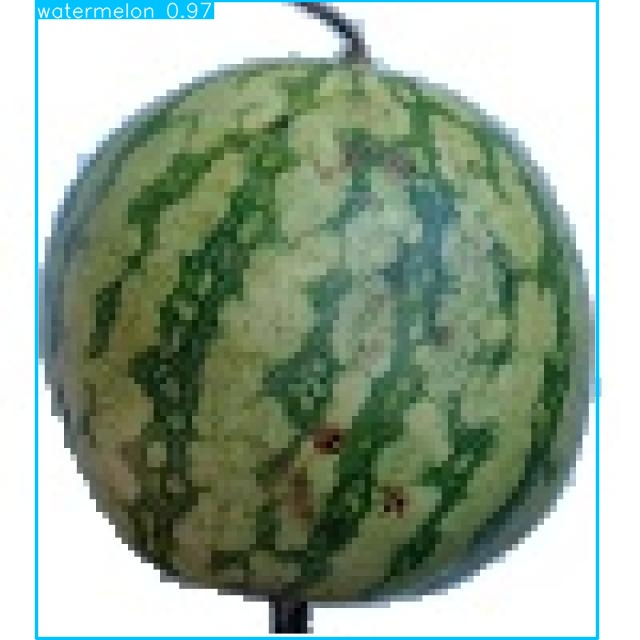

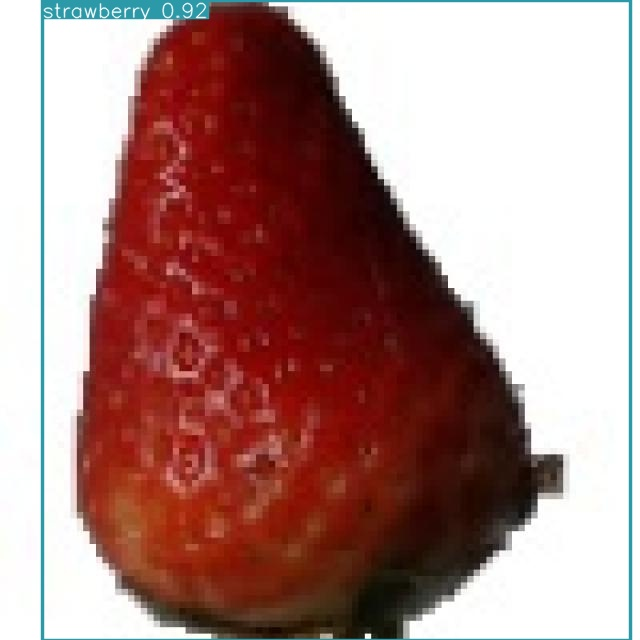

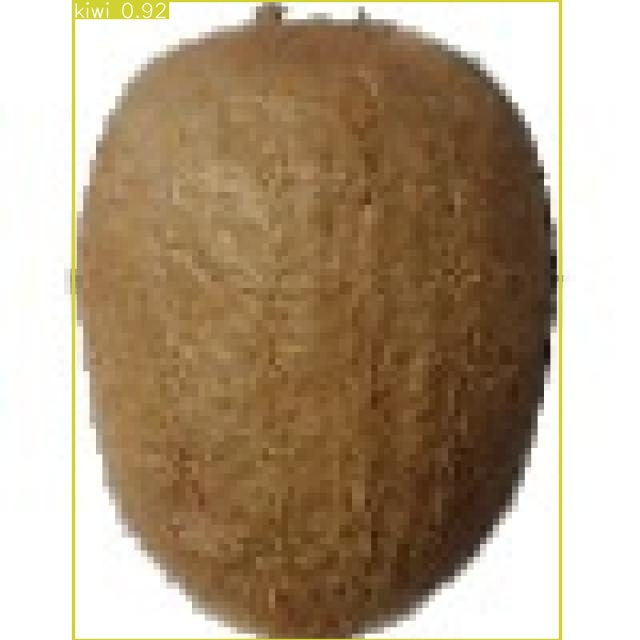

...

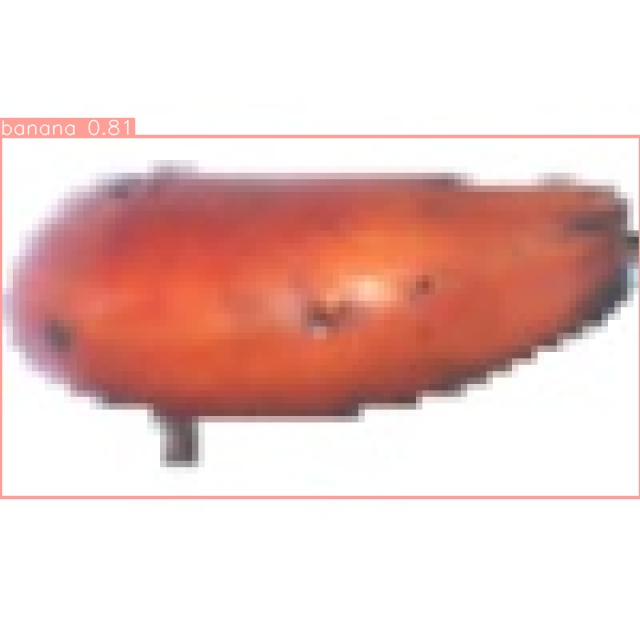

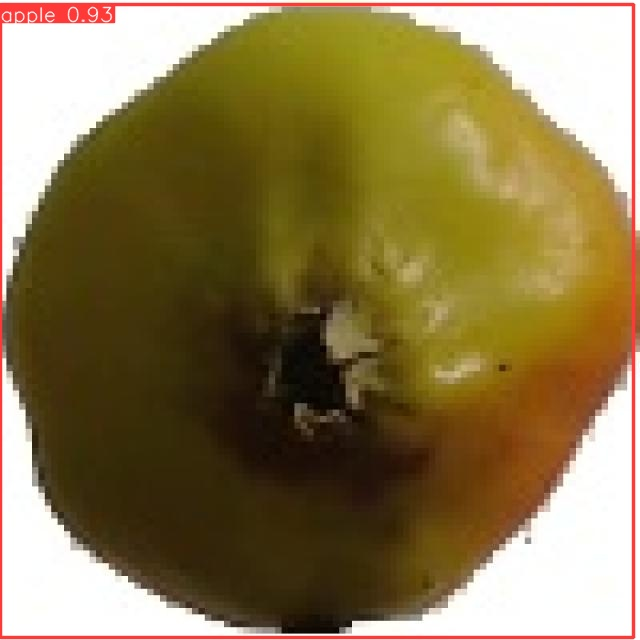

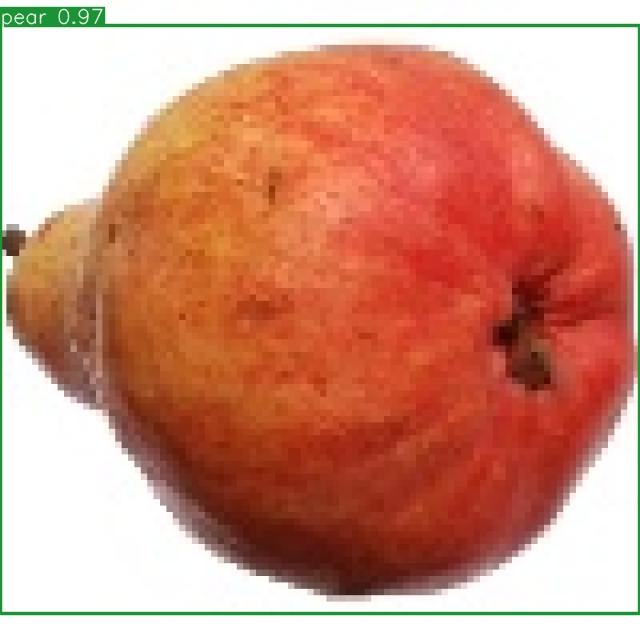

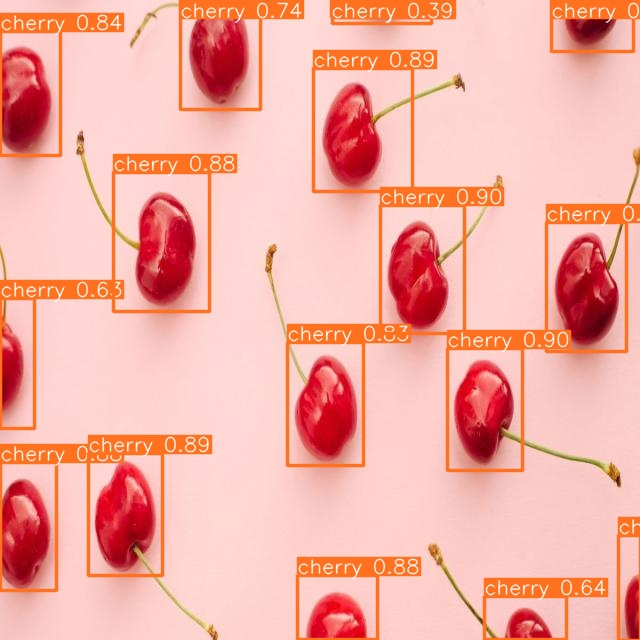

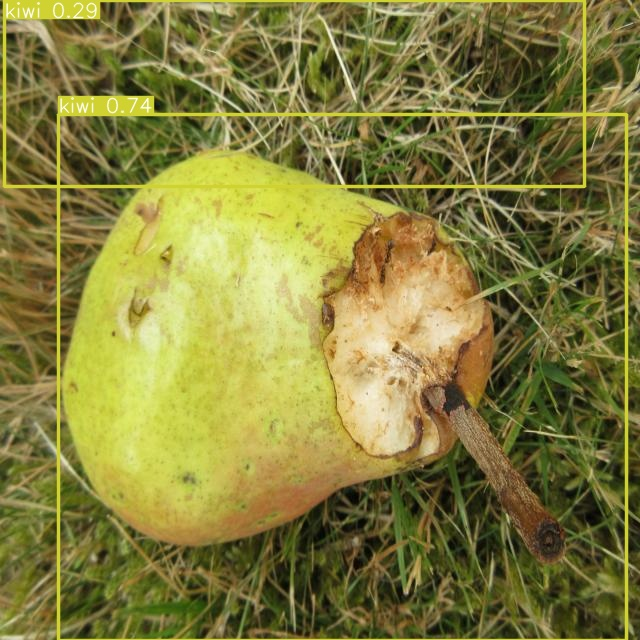

In [14]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/drive/MyDrive/PFE/Detect/Training results/Detection/test2/*.jpg')[:134]:
      display(Image(filename=image_path, width=600))
      print("\n")

In [6]:
# Load a model
model = YOLO('yolov8n.pt')  # load an official model
model = YOLO('/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt')  # load a custom trained model

# Export the model
model.export(format='onnx')

100%|██████████| 6.23M/6.23M [00:00<00:00, 72.9MB/s]
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3007988 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt' with input shape (1, 3, 800, 800) BCHW and output shape(s) (1, 16, 13125) (6.0 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 244.7 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 11.2s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: export success ✅ 12.4s, saved as '/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.onnx' (11.8 MB)

Export complete (15.2s)
Results saved to /content/drive/MyDrive/PFE/Detect/Trainin

'/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.onnx'

In [13]:
# Load a model
model = YOLO('yolov8n.pt')  # load an official model
model = YOLO('/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt')  # load a custom trained model

# Export the model
model.export(format='saved_model')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 3007988 parameters, 0 gradients, 8.1 GFLOPs

PyTorch: starting from '/content/drive/MyDrive/PFE/Detect/Training results/Detection/weights/best.pt' with input shape (1, 3, 800, 800) BCHW and output shape(s) (1, 16, 13125) (6.0 MB)
requirements: Ultralytics requirements ['onnx2tf>=1.15.4,<=1.17.5', 'sng4onnx>=1.0.1', 'onnxsim>=0.4.33', 'onnx_graphsurgeon>=0.3.26', 'tflite_support', 'onnxruntime'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.4/400.4 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 181.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 208.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 MB 262.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6

ImportError: generic_type: cannot initialize type "StatusCode": an object with that name is already defined